In [2]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import math
from scipy.optimize import curve_fit
from sklearn.metrics import mean_squared_error
import math
from random import seed
from random import randint

C:\Users\Agni\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\Agni\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\Agni\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:519: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\Agni\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:520: FutureWarning: Passing (

## Average temperature model – Whitman, WA

In [3]:
avg_temps = pd.read_csv("../data_KS_WA/WA/WA_Climate/WA_Whitman_Avg_Temp_Additional.csv")
# avg_temps.loc[avg_temps[0].type() == int]
avg_temps.columns = ["date", "value", "anomaly"]
print(len(avg_temps))

avg_temps_years = avg_temps['date'].astype(float)
print(len(avg_temps_years))

i = 0
frac = 0
for element in avg_temps_years:
    mod = element % 100
    element = (element - mod) / 100 + frac/12
    avg_temps_years[i] = element
    i += 1
    if (frac % 12 != 11):
        frac += 1
    else:
        frac = 0

avg_temps['date'] = avg_temps_years
avg_temps.head()

1500
1500


,date,value,anomaly
0,1895.000000,26.5,-5.7
1,1895.083333,34.6,-0.4
2,1895.166667,37.9,-3.8
3,1895.250000,48.2,0.4
4,1895.333333,52.3,-3.1


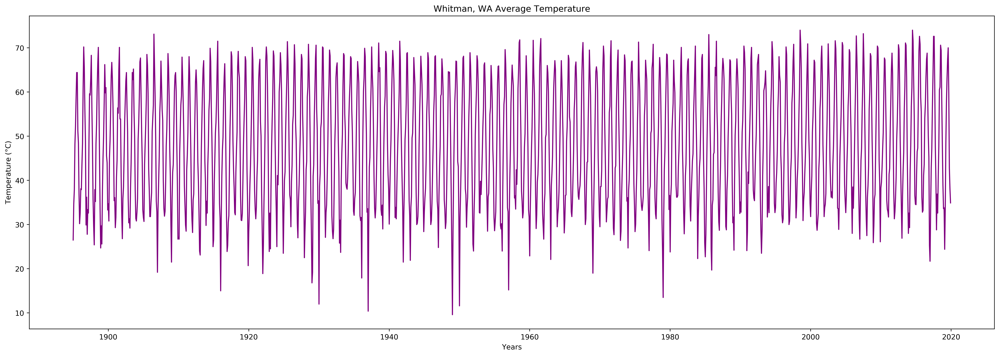

In [4]:
x_avg = avg_temps['date']
y_avg = avg_temps['value']

plt.figure(figsize=(24, 8), dpi=400)
plt.plot(x_avg, y_avg, color='purple')

plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Whitman, WA Average Temperature")
plt.show()

In [7]:
x_avg[0:1200]

0       1895.000000
1       1895.083333
2       1895.166667
3       1895.250000
4       1895.333333
           ...     
1195    1994.583333
1196    1994.666667
1197    1994.750000
1198    1994.833333
1199    1994.916667
Name: date, Length: 1200, dtype: float64

[ 2.22368738e+01  1.31534778e-02 -1.06928510e+01  1.00004656e+00
 -1.53198760e+01]
Mean Squared Error:  15.100705581727937
Root Mean Squared Error:  3.8859626325696874
R^2:  0.9204360264083922
Test Mean Squared Error:  13.671138388633832
Test Root Mean Squared Error:  3.697450255058725
Test R^2:  0.9257376588010948


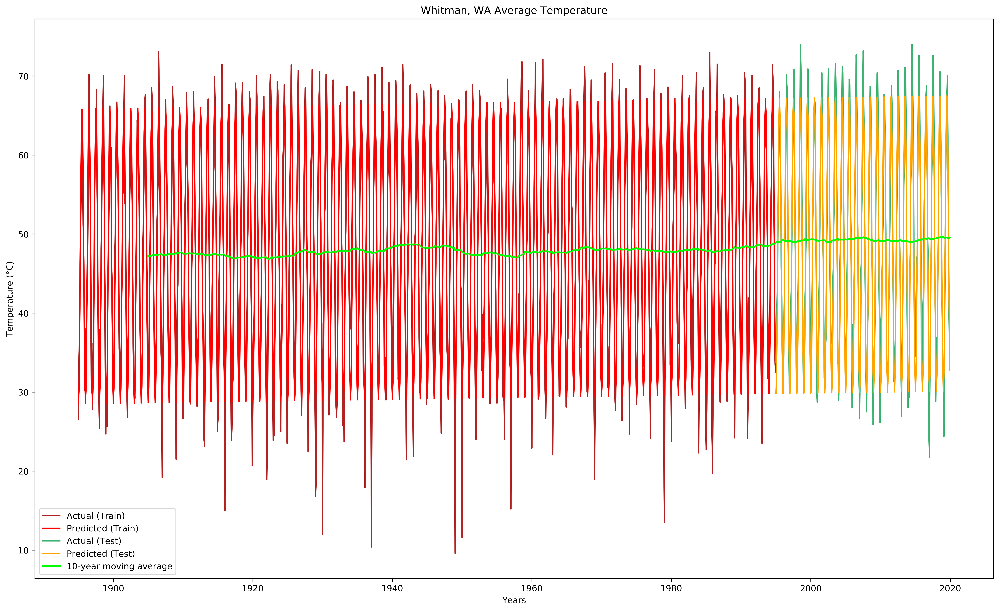

In [11]:
x2_avg = np.nan_to_num(x_avg[0:1200])
N = len(x2_avg)
y2_avg = np.asarray(y_avg[0:1200])

def test_func(t, a, b, c, d, e):
    return  a + b*t + c*np.sin(2*np.pi*d*t) + e*np.cos(2*np.pi*d*t)

params, _ = curve_fit(test_func, x2_avg, y2_avg)

# def test_func(m, a, b, c, d, e):
#     return  100 * a * np.sin(20 * b * m + c) + d + e * m

# params, _ = curve_fit(test_func, x, y, p0  = [100, 2 * numpy.pi / 365, 0, -10, 0])

print(params)
print("Mean Squared Error: ", np.mean((y2_avg - test_func(x2_avg, *params))**2))
print("Root Mean Squared Error: ", math.sqrt(np.mean((y2_avg - test_func(x2_avg, *params))**2)))
residuals = y2_avg - test_func(x2_avg, *params)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((y2_avg - np.mean(y2_avg))**2)
print("R^2: ", 1 - (ss_res / ss_tot))

rolling_mean = avg_temps.value.rolling(window=120).mean()

x3_avg = np.nan_to_num(x_avg[1200:])
N = len(x3_avg)
y3_avg = np.asarray(y_avg[1200:])

print("Test Mean Squared Error: ", np.mean((y3_avg - test_func(x3_avg, *params))**2))
print("Test Root Mean Squared Error: ", math.sqrt(np.mean((y3_avg - test_func(x3_avg, *params))**2)))
residuals = y3_avg - test_func(x3_avg, *params)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((y3_avg - np.mean(y3_avg))**2)
print("Test R^2: ", 1 - (ss_res / ss_tot))

plt.figure(figsize=(20, 12), dpi=400)
plt.plot(x2_avg, y2_avg, color='firebrick', label='Actual (Train)')
plt.plot(x2_avg, test_func(x2_avg, params[0], params[1], params[2], params[3], params[4]), color='red', label='Predicted (Train)')
plt.plot(x3_avg, y3_avg, color='mediumseagreen', label='Actual (Test)')
plt.plot(x3_avg, test_func(x3_avg, params[0], params[1], params[2], params[3], params[4]), color='orange', label='Predicted (Test)')
plt.plot(avg_temps.date, rolling_mean, color='lime', label='10-year moving average', linewidth=2)
plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Whitman, WA Average Temperature")
plt.legend(loc='best')
plt.show()

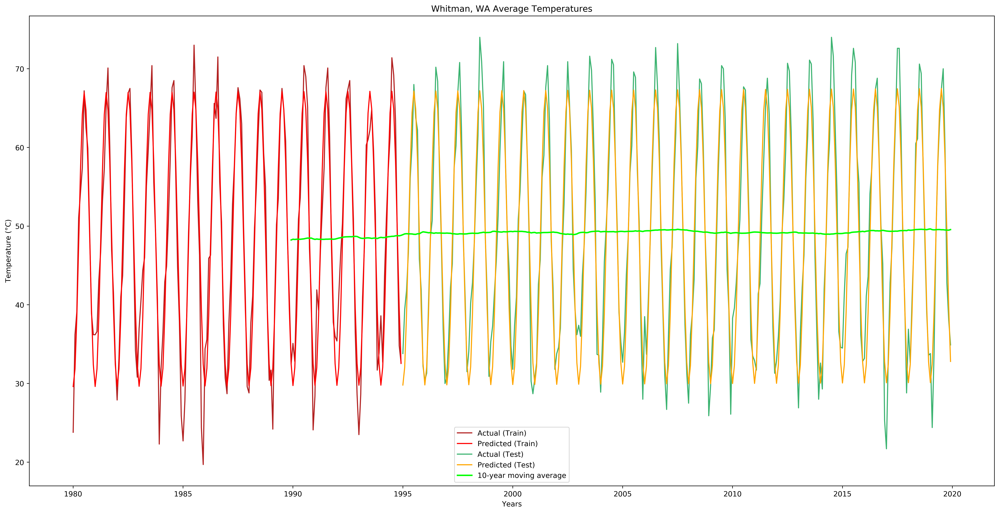

In [10]:
plt.figure(figsize=(24, 12), dpi=400)
plt.plot(x2_avg[1020:], y2_avg[1020:], color='firebrick', label='Actual (Train)')
plt.plot(x2_avg[1020:], test_func(x2_avg[1020:], params[0], params[1], params[2], params[3], params[4]), color='red', label='Predicted (Train)')
plt.plot(x3_avg, y3_avg, color='mediumseagreen', label='Actual (Test)')
plt.plot(x3_avg, test_func(x3_avg, params[0], params[1], params[2], params[3], params[4]), color='orange', label='Predicted (Test)')

rolling_mean = avg_temps.value[1020:].rolling(window=120).mean()
plt.plot(avg_temps.date[1020:], rolling_mean, color='lime', label='10-year moving average', linewidth=2)

plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Whitman, WA Average Temperatures")
plt.legend(loc='best')
plt.show()

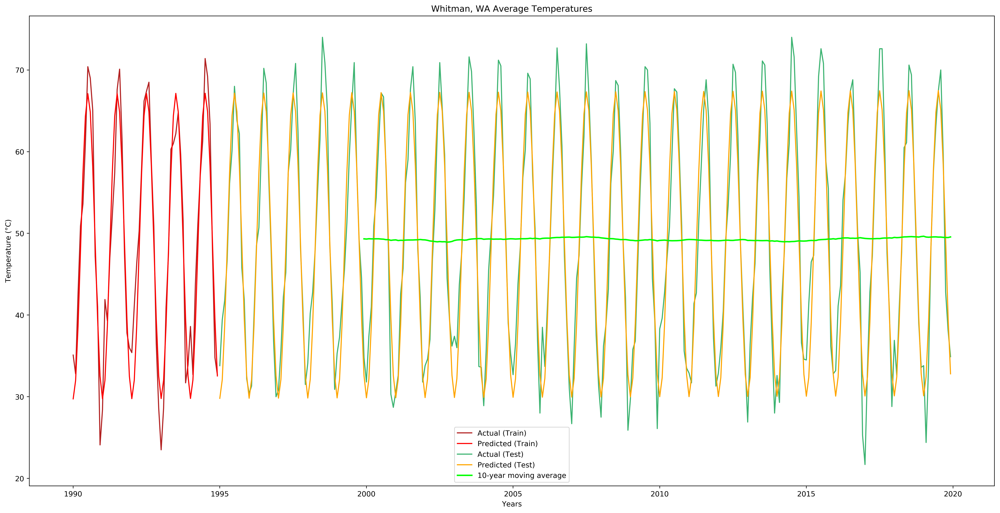

In [14]:
plt.figure(figsize=(24, 12), dpi=400)
plt.plot(x2_avg[1140:], y2_avg[1140:], color='firebrick', label='Actual (Train)')
plt.plot(x2_avg[1140:], test_func(x2_avg[1140:], params[0], params[1], params[2], params[3], params[4]), color='red', label='Predicted (Train)')
plt.plot(x3_avg, y3_avg, color='mediumseagreen', label='Actual (Test)')
plt.plot(x3_avg, test_func(x3_avg, params[0], params[1], params[2], params[3], params[4]), color='orange', label='Predicted (Test)')

rolling_mean = avg_temps.value[1140:].rolling(window=120).mean()
plt.plot(avg_temps.date[1140:], rolling_mean, color='lime', label='10-year moving average', linewidth=2)

plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Whitman, WA Average Temperatures")
plt.legend(loc='best')
plt.show()

[ 2.22458576e+01  1.31487564e-02  2.35542836e+01  9.99868106e-01
 -4.91466681e+00  9.99225198e-01]
Mean Squared Error:  13.643852526823517
Root Mean Squared Error:  3.693758590761383
R^2:  0.9258858770344314


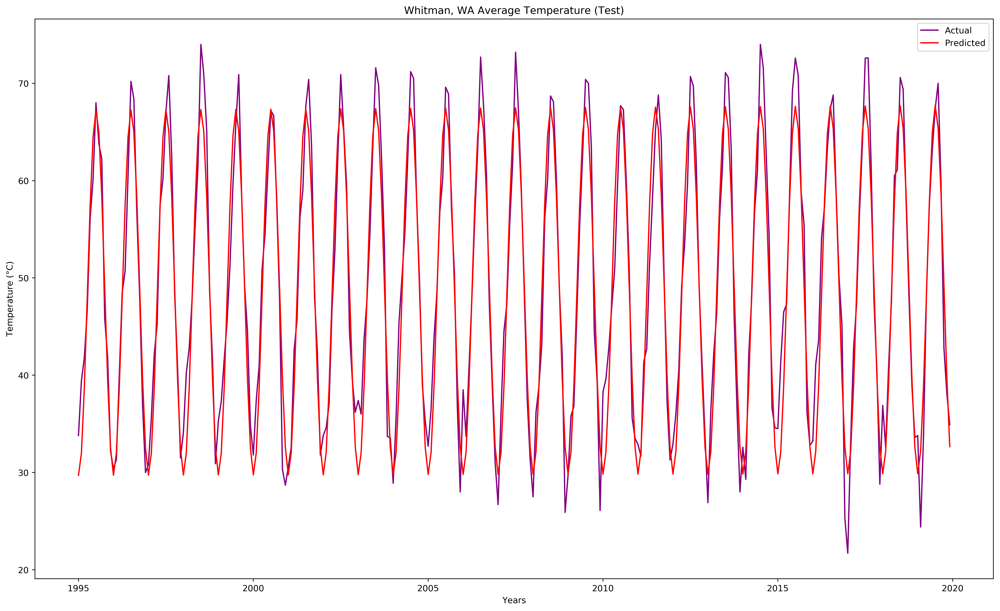

In [6]:
x3_avg = np.nan_to_num(x_avg[1200:])
N = len(x3_avg)
y3_avg = np.asarray(y_avg[1200:])

# def test_func(t, a, b, c, d, e, f):
#     return  a + b*t + c*np.sin(2*np.pi*d*t) + e*np.cos(2*np.pi*f*t)

# def test_func(t, f, a, b, c, d):
#     return  a + b*t + c*np.sin(2*np.pi*f*t)+d*np.cos(2*np.pi*f*t)

# params, _ = curve_fit(test_func, x3_avg, y3_avg)

# def test_func(m, a, b, c, d, e):
#     return  100 * a * np.sin(20 * b * m + c) + d + e * m

# params, _ = curve_fit(test_func, x, y, p0  = [100, 2 * numpy.pi / 365, 0, -10, 0])

print(params)
print("Mean Squared Error: ", np.mean((y3_avg - test_func(x3_avg, *params))**2))
print("Root Mean Squared Error: ", math.sqrt(np.mean((y3_avg - test_func(x3_avg, *params))**2)))
residuals = y3_avg - test_func(x3_avg, *params)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((y3_avg - np.mean(y3_avg))**2)
print("R^2: ", 1 - (ss_res / ss_tot))

# x = np.linspace(tick_list[0],tick_list[-1],100)
# y = 44.69 + 0.0019*(x/12) + 33.69*np.sin(1.728*(x/12) + 0.704)

plt.figure(figsize=(20, 12), dpi=400)
plt.plot(x3_avg, y3_avg, color='purple', label='Actual')
plt.plot(x3_avg, test_func(x3_avg, params[0], params[1], params[2], params[3], params[4], params[5]), color='red', label='Predicted')

plt.xlabel("Years")
plt.ylabel("Temperature (°C)")
plt.title("Whitman, WA Average Temperature (Test)")
plt.legend(loc='best')
plt.show()

## Precipitation model – Whitman, WA

In [15]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

import itertools
import warnings
warnings.filterwarnings('ignore')

Using TensorFlow backend.


In [40]:
rainfall_data = pd.read_csv("../data_KS_WA/WA/WA_Climate/WA_Whitman_Precipitation.csv")
# avg_temps.loc[avg_temps[0].type() == int]
rainfall_data.columns = ["date", "value", "anomaly"]
print(len(rainfall_data))

rainfall_data_years = rainfall_data['date'].astype(float)
print(len(rainfall_data_years))

i = 0
frac = 0
for element in rainfall_data_years:
    mod = element % 100
    element = (element - mod) / 100 + frac/12
    rainfall_data_years[i] = element
    i += 1
    if (frac % 12 != 11):
        frac += 1
    else:
        frac = 0

rainfall_data['date'] = rainfall_data_years
# rainfall_data = rainfall_data['date', 'value']
print(rainfall_data.shape)
print(rainfall_data[['value']].shape)
rainfall_data.head()
# print((rainfall_data['value']).shape)

371
371
(371, 3)
(371, 1)


,date,value,anomaly
0,1989.000000,2.37,0.20
1,1989.083333,1.29,-0.29
2,1989.166667,3.44,1.46
3,1989.250000,0.76,-0.87
4,1989.333333,2.03,0.42


In [41]:
test_rainfall_data = rainfall_data[['value']][287:]
print(test_rainfall_data.shape)
test_rainfall_data.head()

(84, 1)


,value
287,2.51
288,1.39
289,1.06
290,0.95
291,1.86


In [42]:
scaler = MinMaxScaler(feature_range=(0, 1))

train_data = scaler.fit_transform(rainfall_data[['value']][0:300])
test_data = scaler.fit_transform(test_rainfall_data)

In [43]:
train_data[:5]

array([[0.45825243],
       [0.24854369],
       [0.66601942],
       [0.14563107],
       [0.39223301]])

In [44]:
scaler.inverse_transform(train_data[:5])

array([[2.2187767 ],
       [1.20798058],
       [3.22021359],
       [0.71194175],
       [1.90056311]])

In [45]:
print("Shape of train data (1989-2013): " + str(train_data.shape))
print("Shape of test data (2014-2019): " + str(test_data.shape))

Shape of train data (1989-2013): (300, 1)
Shape of test data (2014-2019): (84, 1)


In [46]:
def create_dataset(dataset, look_back=1):
    dataX, dataY = [], []

    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    
    return np.array(dataX), np.array(dataY)

look_back = 12
trainX, trainY = create_dataset(train_data, look_back)
testX, testY = create_dataset(test_data, look_back)

testY

array([0.23236515, 0.30082988, 0.49377593, 0.56431535, 0.31120332,
       0.16804979, 0.31327801, 0.06431535, 0.11825726, 0.06431535,
       0.2593361 , 0.45850622, 0.63900415, 0.37551867, 0.3340249 ,
       0.52904564, 0.16182573, 0.31742739, 0.06431535, 0.03112033,
       0.0186722 , 0.12033195, 0.21369295, 0.3526971 , 0.92738589,
       0.51037344, 0.2780083 , 0.7406639 , 0.24688797, 0.25103734,
       0.1473029 , 0.15352697, 0.04356846, 0.09543568, 1.        ,
       0.34439834, 0.36721992, 0.35684647, 0.64522822, 0.86721992,
       0.31120332, 0.25311203, 0.19502075, 0.        , 0.00829876,
       0.15560166, 0.43568465, 0.57676349, 0.69917012, 0.48340249,
       0.33195021, 0.29460581, 0.41493776, 0.31327801, 0.17634855,
       0.00414938, 0.04149378, 0.00622407, 0.13900415, 0.40871369,
       0.54149378, 0.36929461, 0.54356846, 0.14522822, 0.53319502,
       0.25518672, 0.13070539, 0.03526971, 0.07053942, 0.25311203,
       0.31950207])

In [47]:
print("Shape of train input: " + str(trainX.shape))
print("Shape of train labels: " + str(trainY.shape))
print("Shape of test input: " + str(testX.shape))
print("Shape of test labels: " + str(testY.shape))

Shape of train input: (287, 12)
Shape of train labels: (287,)
Shape of test input: (71, 12)
Shape of test labels: (71,)


### Reshape data

In [48]:
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

print("Shape of train input: " + str(trainX.shape))
print("Shape of train labels: " + str(trainY.shape))
print("Shape of test input: " + str(testX.shape))
print("Shape of test labels: " + str(testY.shape))

Shape of train input: (287, 1, 12)
Shape of train labels: (287,)
Shape of test input: (71, 1, 12)
Shape of test labels: (71,)


### Create Keras model

In [25]:
model = Sequential()
model.add(LSTM(4, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

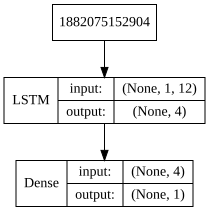

In [26]:
import keras
import pydot as pyd
import graphviz
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

keras.utils.vis_utils.pydot = pyd

#Visualize Model

def visualize_model(model):
  return SVG(model_to_dot(model).create(prog='dot', format='svg'))
#create your model
#then call the function on your model
visualize_model(model)

def plot_keras_model(model, show_shapes=True, show_layer_names=True):
    return SVG(model_to_dot(model, show_shapes=show_shapes, show_layer_names=show_layer_names).create(prog='dot',format='svg'))

plot_keras_model(model, show_shapes=True, show_layer_names=False)

In [27]:
model.fit(trainX, trainY, epochs=700, batch_size=1, verbose=2)

Epoch 1/700
 - 2s - loss: 0.0311
Epoch 2/700
 - 1s - loss: 0.0277
Epoch 3/700
 - 1s - loss: 0.0267
Epoch 4/700
 - 1s - loss: 0.0260
Epoch 5/700
 - 1s - loss: 0.0254
Epoch 6/700
 - 1s - loss: 0.0251
Epoch 7/700
 - 1s - loss: 0.0248
Epoch 8/700
 - 1s - loss: 0.0249
Epoch 9/700
 - 1s - loss: 0.0243
Epoch 10/700
 - 1s - loss: 0.0243
Epoch 11/700
 - 1s - loss: 0.0244
Epoch 12/700
 - 1s - loss: 0.0240
Epoch 13/700
 - 1s - loss: 0.0241
Epoch 14/700
 - 1s - loss: 0.0238
Epoch 15/700
 - 1s - loss: 0.0238
Epoch 16/700
 - 1s - loss: 0.0238
Epoch 17/700
 - 1s - loss: 0.0236
Epoch 18/700
 - 1s - loss: 0.0235
Epoch 19/700
 - 1s - loss: 0.0236
Epoch 20/700
 - 1s - loss: 0.0234
Epoch 21/700
 - 1s - loss: 0.0233
Epoch 22/700
 - 1s - loss: 0.0232
Epoch 23/700
 - 1s - loss: 0.0233
Epoch 24/700
 - 1s - loss: 0.0230
Epoch 25/700
 - 1s - loss: 0.0231
Epoch 26/700
 - 1s - loss: 0.0230
Epoch 27/700
 - 1s - loss: 0.0231
Epoch 28/700
 - 1s - loss: 0.0230
Epoch 29/700
 - 1s - loss: 0.0228
Epoch 30/700
 - 1s - lo

 - 1s - loss: 0.0191
Epoch 239/700
 - 1s - loss: 0.0190
Epoch 240/700
 - 1s - loss: 0.0189
Epoch 241/700
 - 1s - loss: 0.0190
Epoch 242/700
 - 1s - loss: 0.0190
Epoch 243/700
 - 1s - loss: 0.0189
Epoch 244/700
 - 1s - loss: 0.0189
Epoch 245/700
 - 1s - loss: 0.0187
Epoch 246/700
 - 1s - loss: 0.0188
Epoch 247/700
 - 1s - loss: 0.0189
Epoch 248/700
 - 1s - loss: 0.0189
Epoch 249/700
 - 1s - loss: 0.0189
Epoch 250/700
 - 1s - loss: 0.0187
Epoch 251/700
 - 1s - loss: 0.0186
Epoch 252/700
 - 1s - loss: 0.0191
Epoch 253/700
 - 1s - loss: 0.0188
Epoch 254/700
 - 1s - loss: 0.0190
Epoch 255/700
 - 1s - loss: 0.0187
Epoch 256/700
 - 1s - loss: 0.0186
Epoch 257/700
 - 1s - loss: 0.0187
Epoch 258/700
 - 1s - loss: 0.0189
Epoch 259/700
 - 1s - loss: 0.0186
Epoch 260/700
 - 1s - loss: 0.0187
Epoch 261/700
 - 1s - loss: 0.0186
Epoch 262/700
 - 1s - loss: 0.0189
Epoch 263/700
 - 1s - loss: 0.0185
Epoch 264/700
 - 1s - loss: 0.0187
Epoch 265/700
 - 1s - loss: 0.0186
Epoch 266/700
 - 1s - loss: 0.0186

Epoch 473/700
 - 1s - loss: 0.0165
Epoch 474/700
 - 1s - loss: 0.0165
Epoch 475/700
 - 1s - loss: 0.0167
Epoch 476/700
 - 1s - loss: 0.0165
Epoch 477/700
 - 1s - loss: 0.0161
Epoch 478/700
 - 1s - loss: 0.0167
Epoch 479/700
 - 1s - loss: 0.0164
Epoch 480/700
 - 1s - loss: 0.0164
Epoch 481/700
 - 1s - loss: 0.0166
Epoch 482/700
 - 1s - loss: 0.0164
Epoch 483/700
 - 1s - loss: 0.0163
Epoch 484/700
 - 1s - loss: 0.0166
Epoch 485/700
 - 1s - loss: 0.0165
Epoch 486/700
 - 1s - loss: 0.0163
Epoch 487/700
 - 1s - loss: 0.0166
Epoch 488/700
 - 1s - loss: 0.0162
Epoch 489/700
 - 1s - loss: 0.0169
Epoch 490/700
 - 1s - loss: 0.0163
Epoch 491/700
 - 1s - loss: 0.0165
Epoch 492/700
 - 1s - loss: 0.0166
Epoch 493/700
 - 1s - loss: 0.0166
Epoch 494/700
 - 1s - loss: 0.0165
Epoch 495/700
 - 1s - loss: 0.0168
Epoch 496/700
 - 1s - loss: 0.0163
Epoch 497/700
 - 1s - loss: 0.0165
Epoch 498/700
 - 1s - loss: 0.0167
Epoch 499/700
 - 1s - loss: 0.0167
Epoch 500/700
 - 1s - loss: 0.0164
Epoch 501/700
 - 1s 

### Predict values using the trained model

In [49]:
trainPredict = model.predict(trainX)
# testPredictInTrain = model.predict(trainX[-look_back:, :, :])
testPredict = model.predict(testX)

### Inverse transform the data

In [50]:
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
# testPredictInTrain = scaler.inverse_transform(testPredictInTrain)
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [51]:
testPredict.shape

(71, 1)

### Calculate RMSE for train and test predictions

In [52]:
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))

Train Score: 0.57 RMSE
Test Score: 1.04 RMSE


### Generate dates for index

In [53]:
dates = rainfall_data['date']
print(dates)
dates.shape

0      1989.000000
1      1989.083333
2      1989.166667
3      1989.250000
4      1989.333333
          ...     
366    2019.500000
367    2019.583333
368    2019.666667
369    2019.750000
370    2019.833333
Name: date, Length: 371, dtype: float64


(371,)

### Create Dataframes for actual and predicted values of train data

In [33]:
trainActual = pd.DataFrame({'Precipitation': trainY[0]})
# trainActual.index = dates[0:287]
trainActual.index = dates[12:299]

trainPredictdf = pd.DataFrame({'Precipitation': trainPredict[:,0]})
# trainPredictdf.index = dates[0:287]
trainPredictdf.index = dates[12:299]

In [34]:
print(trainX.shape)
print(trainX)

(287, 1, 12)
[[[0.45825243 0.24854369 0.66601942 ... 0.21553398 0.31456311 0.18252427]]

 [[0.24854369 0.66601942 0.14563107 ... 0.31456311 0.18252427 0.49320388]]

 [[0.66601942 0.14563107 0.39223301 ... 0.18252427 0.49320388 0.19029126]]

 ...

 [[0.         0.46019417 0.5592233  ... 0.4038835  0.02330097 0.13009709]]

 [[0.46019417 0.5592233  0.48543689 ... 0.02330097 0.13009709 0.46601942]]

 [[0.5592233  0.48543689 0.26796117 ... 0.13009709 0.46601942 0.05048544]]]


In [35]:
trainY = trainY.reshape(287,)

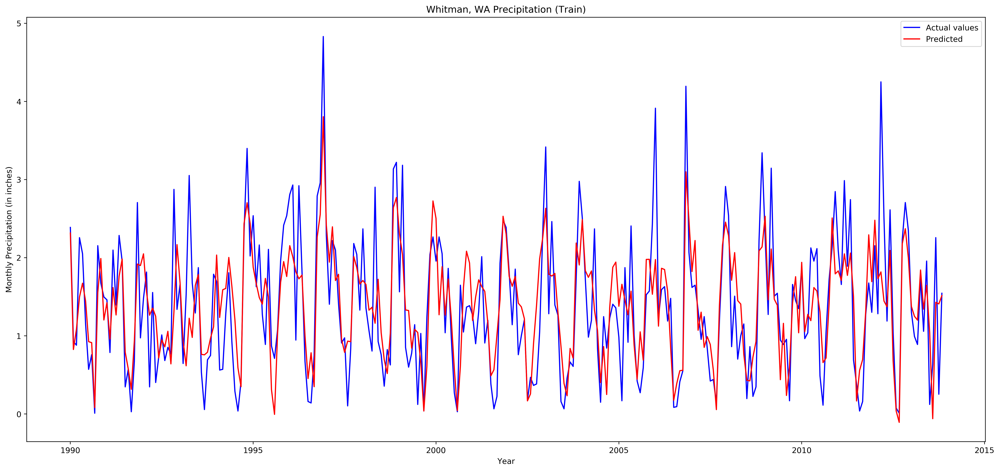

In [36]:
plt.figure(figsize=(22,10), dpi=400)
# plt.plot(dates[0:287], trainY, color='blue', label='Actual values')
# plt.plot(dates[0:287], trainPredictdf, color='red', label='Predicted')
plt.plot(trainActual, color='blue', label='Actual values')
plt.plot(trainPredictdf, color='red', label='Predicted')
plt.title('Whitman, WA Precipitation (Train)')
plt.xlabel('Year')
plt.ylabel('Monthly Precipitation (in inches)')
plt.legend(loc='best')

In [57]:
testActual = pd.DataFrame({'Precipitation': testY[0]})
testActual.index = dates[300:]

testPredictdf = pd.DataFrame({'Precipitation': testPredict[:,0]})
testPredictdf.index = dates[300:]

In [58]:
testPredictdf.shape

(71, 1)

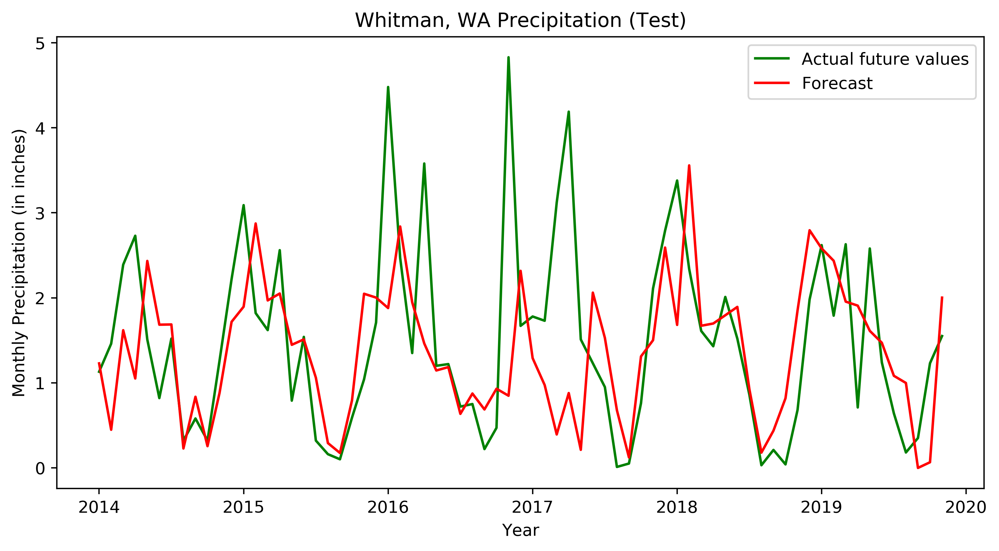

In [59]:
plt.figure(figsize=(10,5), dpi=400)
plt.plot(testActual, color='green', label='Actual future values')
plt.plot(testPredictdf, color='red', label='Forecast')
plt.title('Whitman, WA Precipitation (Test)')
plt.xlabel('Year')
plt.ylabel('Monthly Precipitation (in inches)')
plt.legend(loc='best')

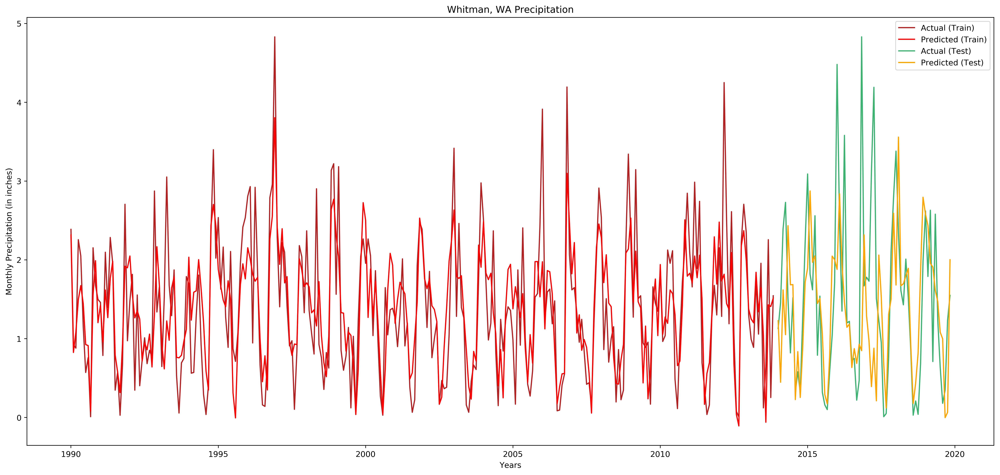

In [61]:
plt.figure(figsize=(22,10), dpi=400)
# plt.plot(dates[0:287], trainY, color='blue', label='Actual values')
# plt.plot(dates[0:287], trainPredictdf, color='red', label='Predicted')
plt.plot(trainActual, color='firebrick', label='Actual (Train)')
plt.plot(trainPredictdf, color='red', label='Predicted (Train)')
plt.plot(testActual, color='mediumseagreen', label='Actual (Test)')
plt.plot(testPredictdf, color='orange', label='Predicted (Test)')
plt.title('Whitman, WA Precipitation')
plt.xlabel('Years')
plt.ylabel('Monthly Precipitation (in inches)')
plt.legend(loc='best')